# < 3. 잘 만든 Augmentation, 이미지 100장 안부럽다 > 

## 학습 내용
1. 데이터셋의 현실
2. Data Augmentation이란?
3. 텐서플로우를 사용한 Image Augmentation
4. imgaug 라이브러리
5. 더 나아간 기법들

---

## 3.2 데이터셋의 현실

### 1) 대량의 데이터셋

앞서 이야기했듯, 이미지넷은 1,400만 장의 이미지를 보유하고 있으며, 우리가 자주 사용하는 CIFAR-10만 하더라도 학습용 데이터셋은 5만 장이나 됩니다.

이런 규모의 데이터셋을 만드는 데 얼마나 큰 비용이 들까요? 라벨 데이터를 포함해 장당 10원에 불과하다고 하더라도 이미지넷과 같은 데이터셋을 구축하기 위에서는 1억이 넘는 비용이 들어갑니다. 물론 실제로 이러한 데이터셋을 직접 구축하려면 이보다 훨씬 비싼 가격이 들어갑니다.

### 2) 직접 구축하는 데이터셋
사진을 보고 시내의 유명한 카페를 분류하는 모델을 만들어야 하는 프로젝트가 생겼습니다. 그러면 우리는 어떻게 데이터셋을 모을 수 있을까요?

강남의 카페를 조사하기 위해서 인스타그램(Instagram)을 크롤링 해 20여 개 카페의 사진 약 2,500장을 얻을 수 있었다고 상상해 봅시다. 처음 크롤링 할 때는 많았으나 내부 인테리어 사진으로 카페를 구분하기 위해서 음식 사진, 사람 사진을 제외하고 나니 많은 수가 줄어들었습니다. 이처럼 직접 데이터를 수집한다면 만 장 단위로 데이터셋을 모으기가 쉽지 않다는 것을 알 수 있습니다.

---

## 3.3 Data Augmentation이란? (1) 개요

`Data augmentation`은 갖고 있는 데이터셋을 여러 가지 방법으로 증강시켜(augment) 실질적인 학습 데이터셋의 규모를 키울 수 있는 방법입니다. 일반적으로 하드디스크에 저장된 이미지 데이터를 메모리에 로드한 후, 학습시킬 때 변형을 가하는 방법을 사용합니다. 이를 통해 1장의 이미지를 더 다양하게 쓸 수 있게 되겠죠.

데이터가 많아진다는 것은 과적합(overfitting)을 줄일 수 있다는 것을 의미합니다. 또한 우리가 가지고 있는 데이터셋이 실제 상황에서의 입력값과 다를 경우, augmentation을 통해서 실제 입력값과 비슷한 데이터 분포를 만들어 낼 수 있습니다. 예를 들어, 우리가 학습한 데이터는 노이즈가 많이 없는 사진이지만 테스트 이미지는 다양한 노이즈가 있는 경우 테스트에서 좋은 성능을 내기 위해서는 이러한 노이즈의 분포를 예측하고 학습 데이터에 노이즈를 삽입해 모델이 이런 노이즈에 잘 대응할 수 있도록 해야 합니다. 이렇게 data augmentation은 데이터를 늘릴 뿐만 아니라 모델이 실제 테스트 환경에서 잘 동작할 수 있도록 도와주기도 합니다.

### 이미지 데이터 augmentation
이미지 데이터의 augmentation은 포토샵, SNS의 사진 필터, 각종 카메라 앱에서 흔히 발견할 수 있는 기능들과 비슷합니다. 쉬운 예로는 모델이 다양한 색상의 사진을 학습하게 하기 위해서 우리가 인스타그램에 업로드할 때 쓰는 색상 필터들을 적용해 볼 수 있죠. 또 좌우 대칭이나 상하 반전과 같이 이미지의 공간적 배치를 조작할 수도 있습니다.

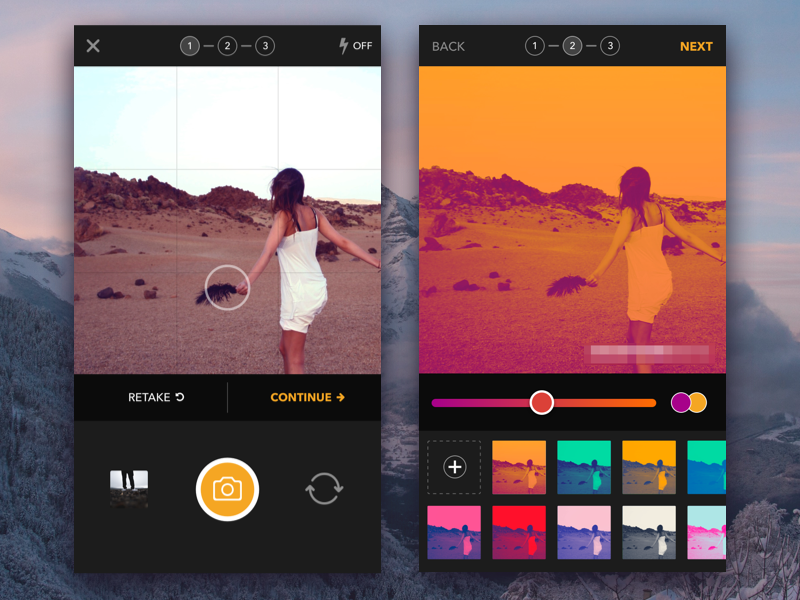

---

## 3.4 Data Augmentation이란? (2) 다양한 Image Augmentation 방법

https://www.tensorflow.org/tutorials/images/data_augmentation

### Flipping
- Flip은 이미지를 대칭하는 기능
- 좌우 또는 상하로 이미지를 반전시키는 방법
- 분류 문제에서는 문제가 없을 수 있지만 물체 탐지(detection), 세그멘테이션(segmentation) 문제 등 정확한 정답 영역이 존재하는 문제에 적용할 때에는 라벨도 같이 좌우 반전을 해주어야 합니다.
- 만약 숫자나 알파벳 문자를 인식(recognition)하는 문제에 적용할 때도 주의해야 할 것입니다. 상하나 좌우가 반정될 경우 다른 글자가 될 가능성이 있으니까요.
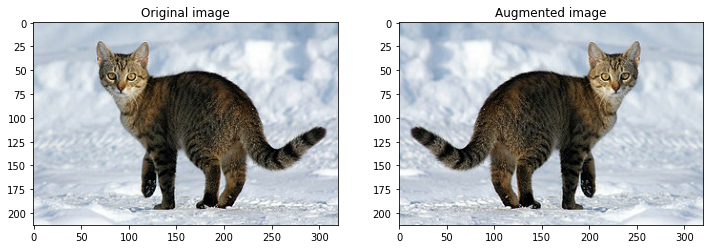

### Gray scale
- Gray scale은 3가지 채널(channel)을 가진 RGB 이미지를 하나의 채널을 가지도록 해줍니다.
- 아래의 시각화 예제는 흑백 대신 다른 색상으로 이미지를 표현했습니다. 
- RGB 각각의 채널마다 가중치(weight)를 주어 가중합(weighted sum)을 하였습니다. 사용된 가중치의 경우 합이 1이 됨을 알 수 있습니다
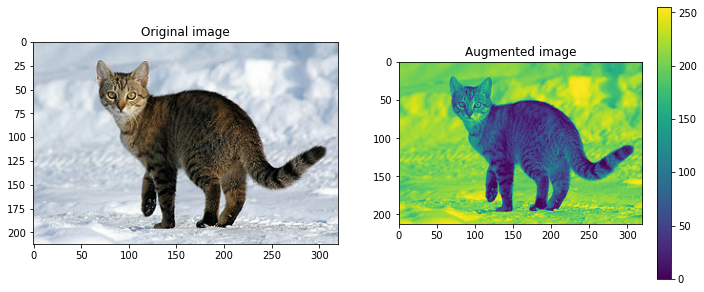

### Saturation
- Saturation은 RGB 이미지를 HSV(Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현) 이미지로 변경하고 S(saturation) 채널에 오프셋(offset)을 적용, 조금 더 이미지를 선명하게 만들어 줍니다.
- 이후 다시 우리가 사용하는 RGB 색상 모델로 변경을 해줍니다.

    - RGB 모델 - 가장 기본적인 색상 모델로, 색(Color)을 Red, Green, Blue의 3가지 성분의 조합으로 생각하는 것을 말합니다. RGB 모델에서 검은색은 R = G = B = 0, 흰색은 R = G = B = 255, 빨간색은 R = 255, G = B = 0, 노란색은 R = G = 255, B = 0으로 표현합니다. R = G = B 인 경우는 무채색인 Gray 색상이 됩니다. R, G, B 각각은 0 ~ 255 사이의 값을 가질 수 있으므로, RGB 색상 모델을 사용하면 총 256 256 256 = 16,777,216 가지의 색을 표현할 수 있습니다. ex)(0, 0, 0) : 검정,(255, 255, 255) : 흰색,(255, 0, 0) : 빨강,(0, 255, 0) : 초록,(0, 0, 255) : 파랑
    - HSV 모델 - Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현합니다. Hue는 색조 ( 예 : 붉은색 계열인지 푸른색 계열인 지) 를 나타내고, Saturation은 그 색이 얼마나 선명한(순수한) 색인지, Value 는 밝기(Intensity)를 나타냅니다. HSV 모델은 우리가 색을 가장 직관적으로 표현할 수 있는 모델이고, 머리속에서 상상하는 색을 가장 쉽게 만들어낼 수 있는 모델입니다. 영상처리 / 이미지 처리 에서 HSV 모델을 사용할 때, H, S, V 각각은 0 ~ 255 사이의 값으로 표현됩니다. H 값은 색의 종류를 나타내기에 크기는 의미가 없으며 단순한 인덱스(Index)를 나타냅니다. S 값은 0이면 무채색 (gray 색), 255면 가장 선명한(순수한) 색임을 나타냅니다. V 값은 작을수록 어둡고, 클수록 밝은 색임을 나타냅니다. HSV 색상 모델은 그림과 같이 원뿔(conic) 형태, 원기둥(cylindric) 형태가 있습니다.
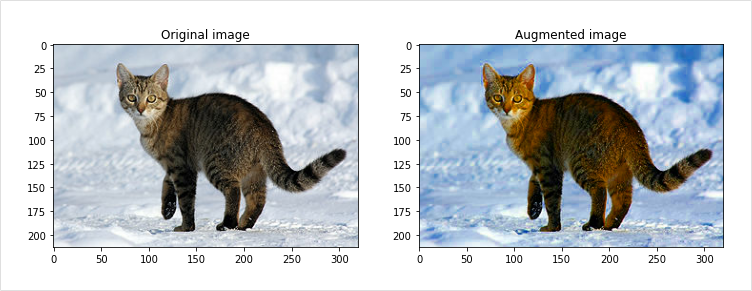

### Brightness
- 밝기를 조절할 수도 있습니다.
- 우리가 주로 사용하는 RGB에서 (255,255,255)는 흰색을, (0,0,0)은 검은색을 의미합니다. 따라서 이미지는 RGB 채널에서 값을 더해주면 밝아지고, 빼주면 어두워집니다.
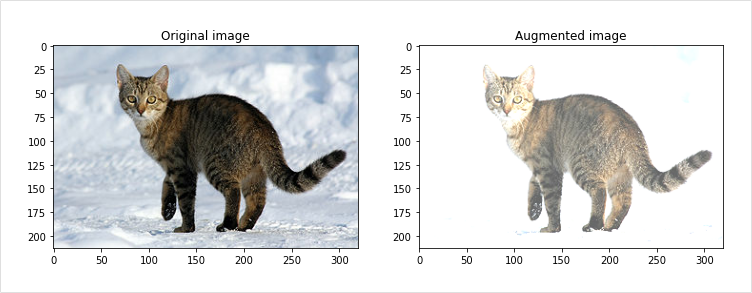

### Rotation
- Rotation은 이미지의 각도를 변환해 줍니다
- 90도의 경우 직사각형 형태가 유지되기 때문에 이미지의 크기만 조절해 주면 바로 사용할 수 있습니다.
- 하지만 90도 단위로 돌리지 않는 경우 직사각형 형태에서 기존 이미지로 채우지 못하는 영역을 어떻게 처리해야 할지 유의해야 합니다.
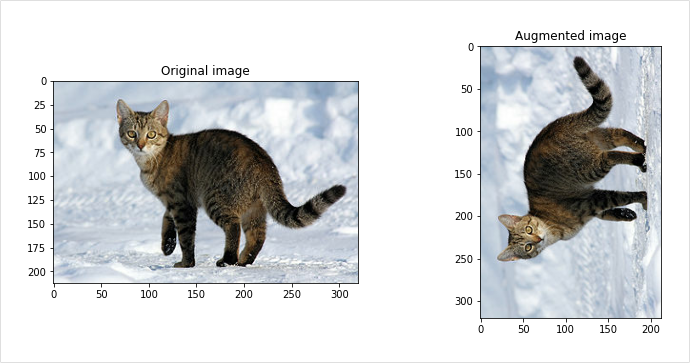

### Center Crop
- Center crop은 이미지의 중앙을 기준으로 확대하는 방법입니다.
- 너무 작게 center crop을 할 경우 본래 가진 라벨과 맞지 않게 되는 상황이 발생할 수 있으니 주의가 필요합니다.
- 예를 들어 고양이 라벨의 이미지를 확대해 한 장 더 만들어내려면, 이미지 내에 고양이의 형상을 유지해야 하고 털만 보이는 이미지를 만들어서는 안 됩니다.
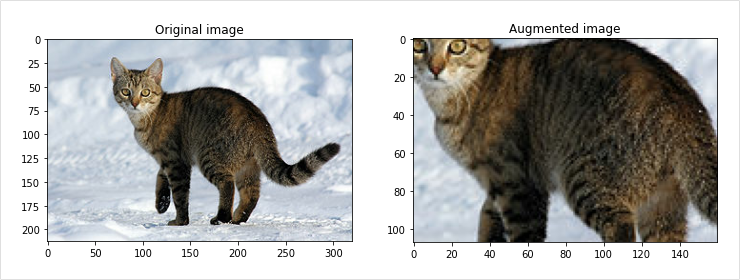


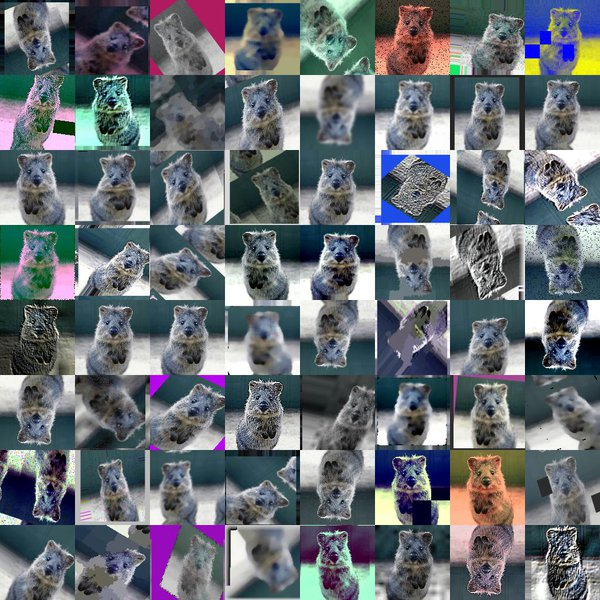

- 위의 이미지에서 언급하지 않은 것들이 있다
    - Gaussian noise
    - Contrast change
    - Sharpen
    - Affine transformation
    - Padding
    - Blurring

---

## 3.5 텐서플로우를 사용한 Image Augmentation (1) Flip


### 준비하기


In [1]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = os.getenv('HOME') + '/aiffel/data_augmentation/images/mycat.jpg'
sample_img_path

'/aiffel/aiffel/data_augmentation/images/mycat.jpg'

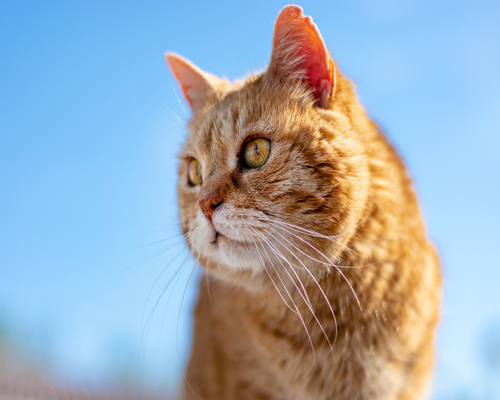

In [2]:
# resize
image = Image.open(sample_img_path).resize((500,400))
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

image

### Flip 해보기
- filp_left_right 와 filp_up_down 두 가지로 좌우와 상하 반전으로 구분

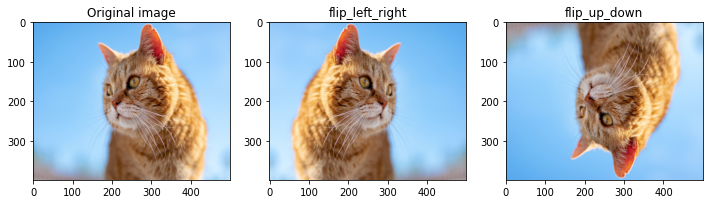

In [3]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

#### 상하좌우 반전을 적용하는 함수

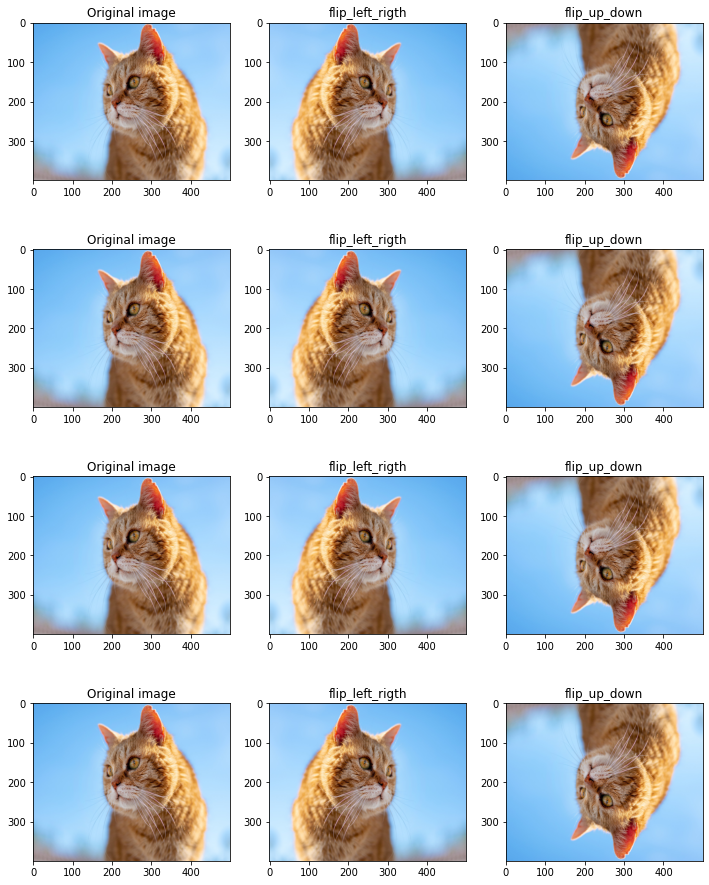

In [4]:
plt.figure(figsize=(12,16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)
    
    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_rigth')
    plt.imshow(flip_lr_image)
    
    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

---

## 3.6 텐서플로우를 사용한 Image Augmentation (2) Center Crop

Center crop은 이전에 설명드렸던 것과 같이 중앙을 기준으로 자른 이미지를 사용하는 augmentation 기법입니다.

단순하게 중심점을 기준으로 사진을 확대하는 것으로 생각하기 쉽지만, 적용할 때 주의해 사용해야 합니다. `central_fraction`은 얼마나 확대를 할지를 조절하는 매개변수입니다. 1.0인 경우는 원본 이미지와 같습니다. 그러나 예를 들어 고양이 이미지를 확대하면 0.5까지는 보일 수 있지만 0.25 수준으로 내려가면 털만 보이고 고양이의 형상을 찾기 어려울 수 있습니다. 따라서 central_fraction의 범위를 문제가 생기지 않는 범위에서 랜덤하게 조절되도록 해야 합니다.



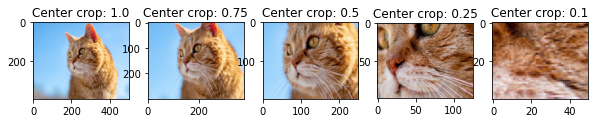

In [5]:
plt.figure(figsize=(12,15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)

for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

- 랜덤하게 central_crop을 적용하는 함수는 텐서플로우에서 기본적으로 제공되지 않는다
- 파이썬의 `random` 모듈을 사용하거나 텐서플로우의 랜덤 모듈을 사용해서 만들어야 한다
- https://www.tensorflow.org/api_docs/python/tf/random/uniform
- https://www.tensorflow.org/api_docs/python/tf/random/normal

In [13]:
def random_central_crop(image_tensor, range=(0,1)):
    central_fraction = tf.random.uniform([1], minval=range[0],maxval=range[1], dtype=tf.float32 )
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor


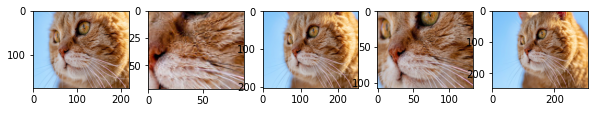

In [14]:
plt.figure(figsize=(12, 15))

col = 5
for i, frac in enumerate(central_fractions):
    cropped_tensor =random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

---

## 3.7 텐서플로우를 사용한 Image Augmentation (3) 직접 해보기

### tf.image.random_crop()
- https://www.tensorflow.org/api_docs/python/tf/image/random_crop

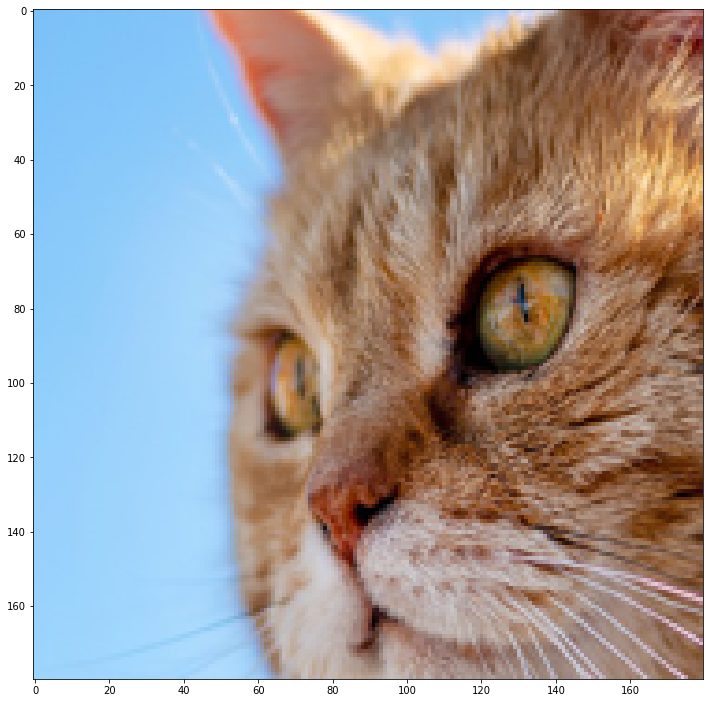

In [20]:
plt.figure(figsize=(12,15))

random_crop_tensor = tf.image.random_crop(image_tensor, [180,180,3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

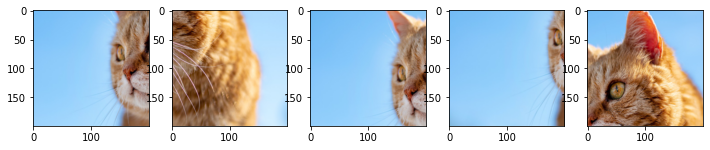

In [21]:
# display 5 random cropped images
plt.figure(figsize=(12, 15))

for i in range(5):
    random_crop_tensor = tf.image.random_crop(image_tensor,[200,200,3])
    random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)
    plt.subplot(1,5,i+1)
    plt.imshow(random_crop_image)

### tf.image.random_brightness()
- https://www.tensorflow.org/api_docs/python/tf/image/random_brightness

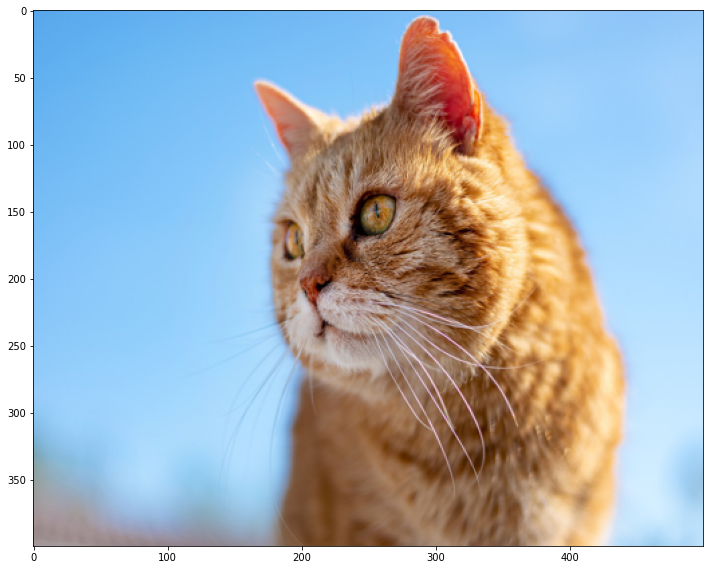

In [25]:
plt.figure(figsize=(12,15))

random_brightness_tensor = tf.image.random_brightness(image_tensor, 128)
random_brightness_image = tf.keras.preprocessing.image.array_to_img(random_brightness_tensor)

plt.imshow(random_brightness_image)
plt.show()

> `tf.image.random_brightness()`만 적용할 경우 이미지 텐서 값의 범위가 0~255를 초과하게 될 수도 있습니다. 이 경우 plt.imshow()에서 rescale되어 밝기 변경 효과가 상쇄되어 보일 수도 있습니다. <br>
`tf.image.random_brightness()` 다음에는 `tf.clip_by_value()`를 적용해 주는 것을 잊지 마세요.


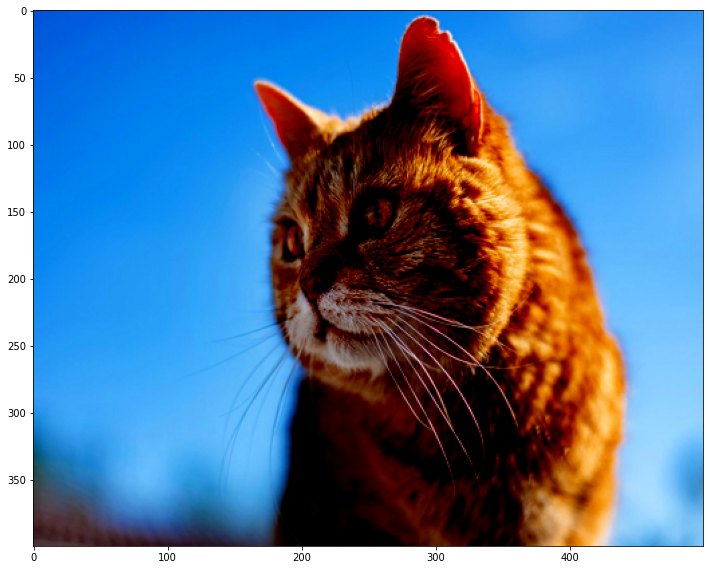

In [24]:
plt.figure(figsize=(12,15))

random_bright_tensor = tf.image.random_brightness(image_tensor,max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

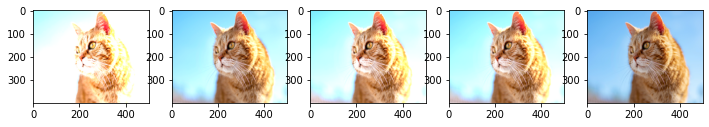

In [27]:
# display 5 random cropped images
plt.figure(figsize=(12, 15))

for i in range(5):
    random_bright_tensor = tf.image.random_brightness(image_tensor,max_delta=128)
    random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
    random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)
    plt.subplot(1,5,i+1)
    plt.imshow(random_bright_image)

---

## 3.8 albumentations 라이브러리

### albumentations 라이브러리 사용하기

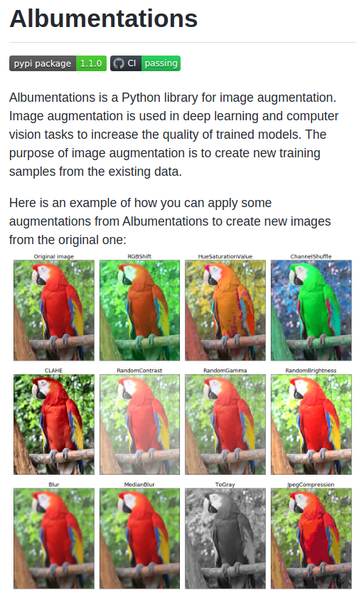

https://github.com/albumentations-team/albumentations

#### Albummentations 라이브러리
- 이미지 증강을 위한 python 라이브버리
- 이미지 증강은 딥러닝 및 컴퓨터 비전 작업에서 훈련된 모델의 품질을 높이는 데 사용된다
- 도 한 아래 사진 처럼 다양한 작업에서 사용되고 있다
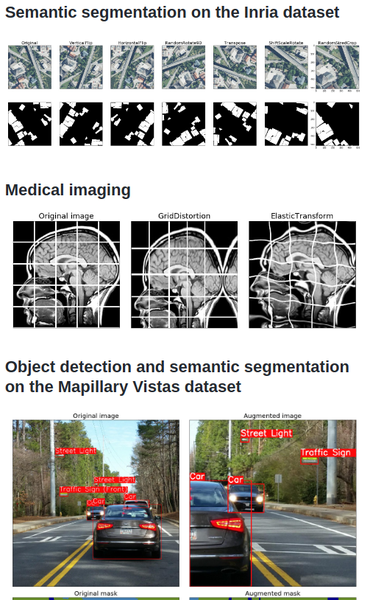

In [29]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [30]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

print("슝")

슝


### augmentation 기법 사용해 보기

#### transforms.Affine()
- `transforms.Affine()`의 `Affine()`은 아핀 변환(Affine transform)을 이미지에 적용합니다.
- 2D 변환의 일종인 아핀 변환은 이미지의 스케일(scale)을 조절하거나 평행이동, 또는 회전 등의 변환을 줄 수 있습니다


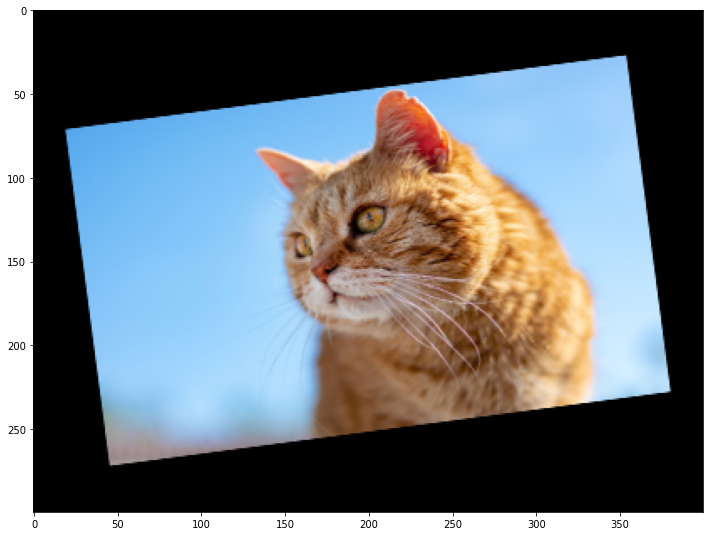

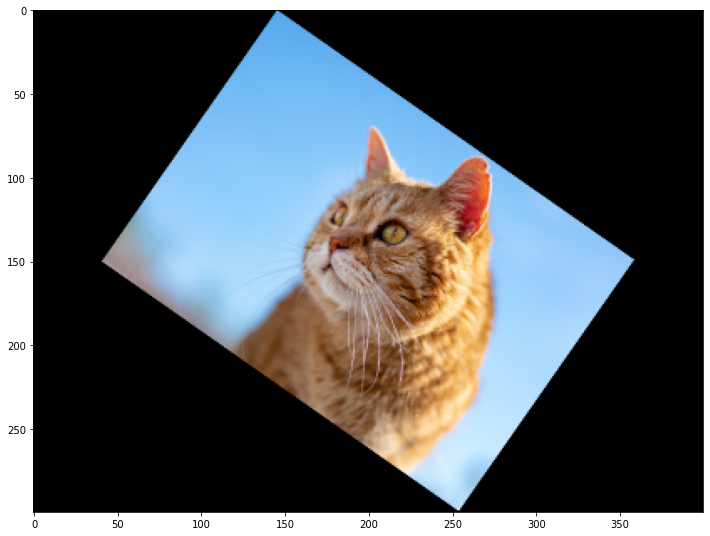

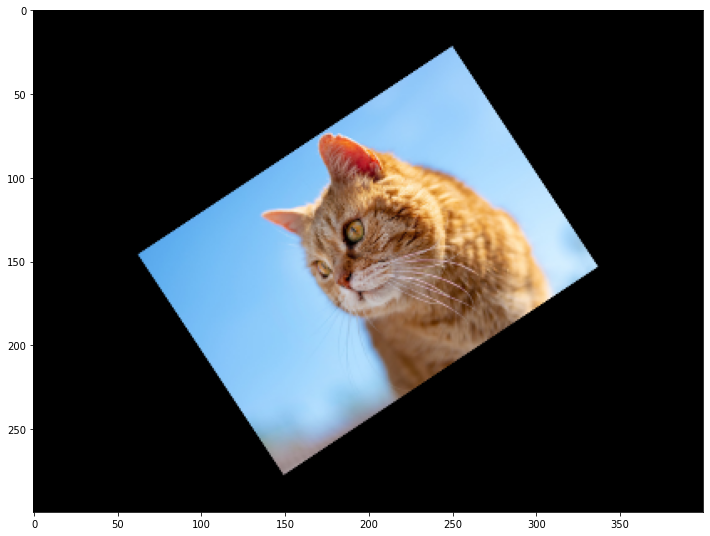

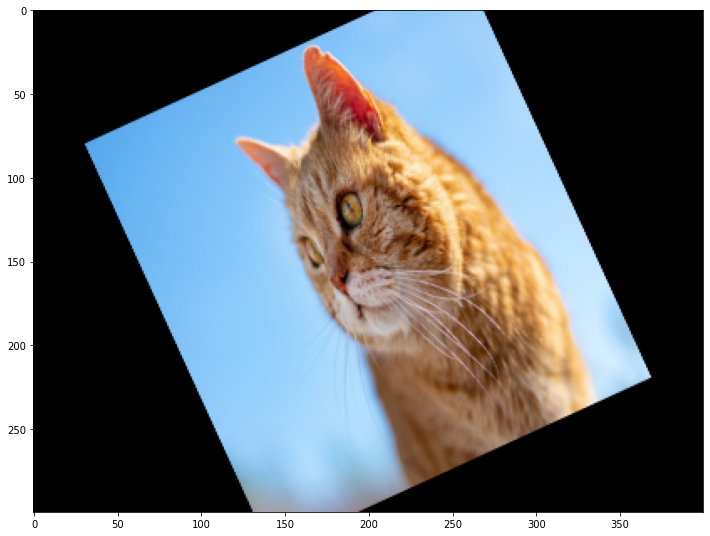

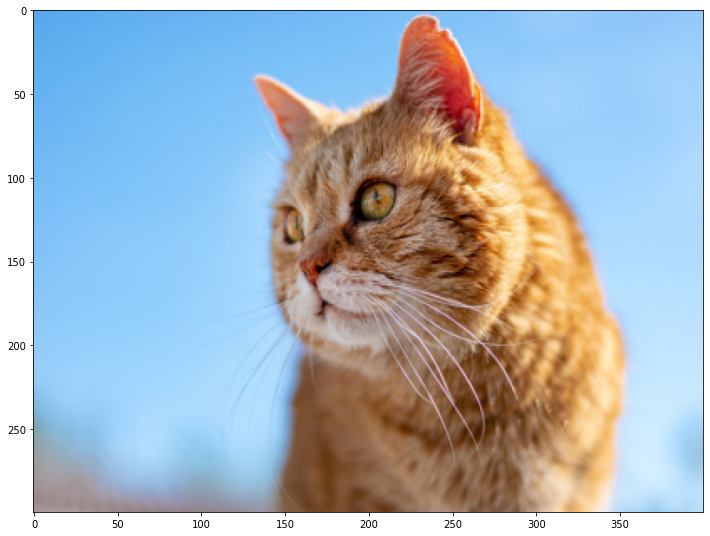

In [38]:
import albumentations as A

for i in range(5):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) 
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

#### ransforms.RandomCrop()

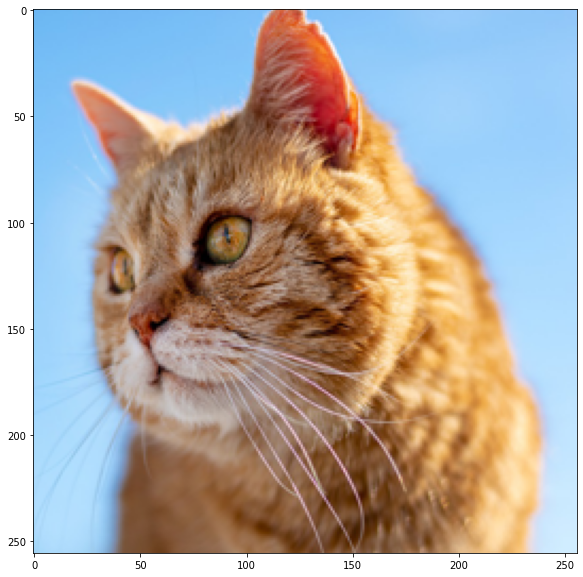

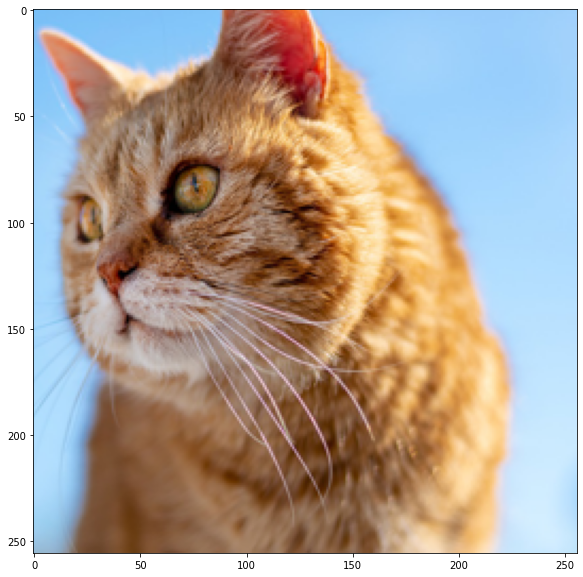

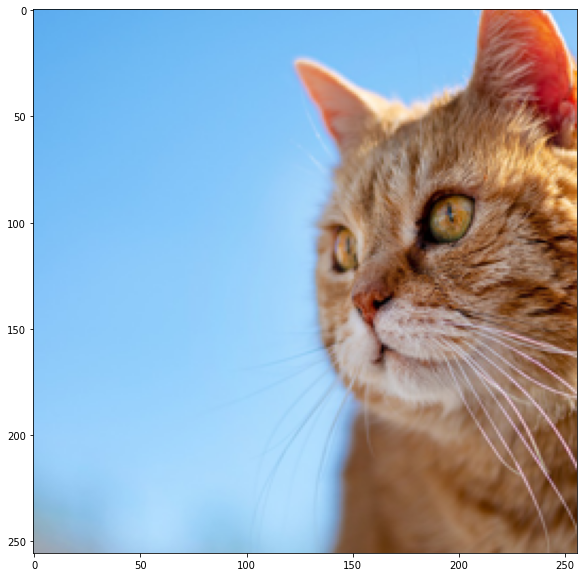

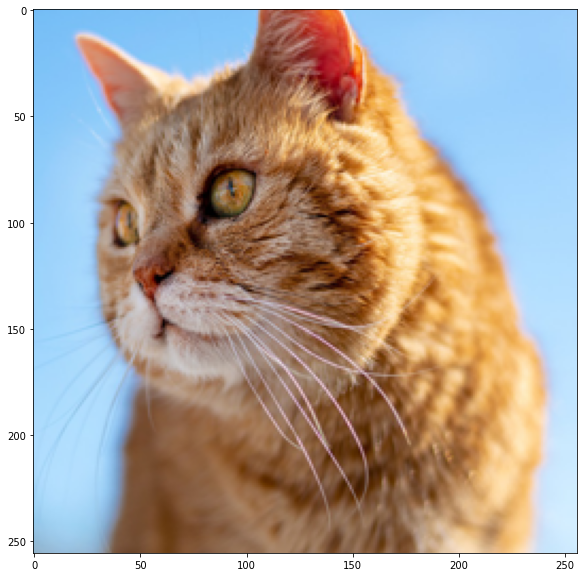

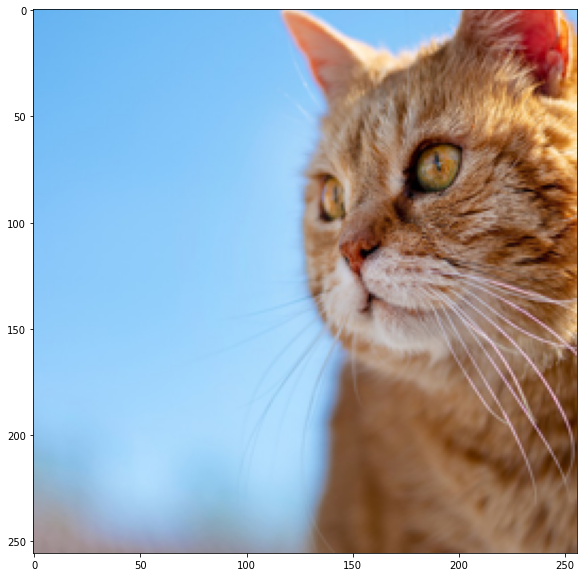

In [37]:
import random
for i in range(5):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

#### MedianBlur()
- 블러처리를 쉽게 할 수 있다


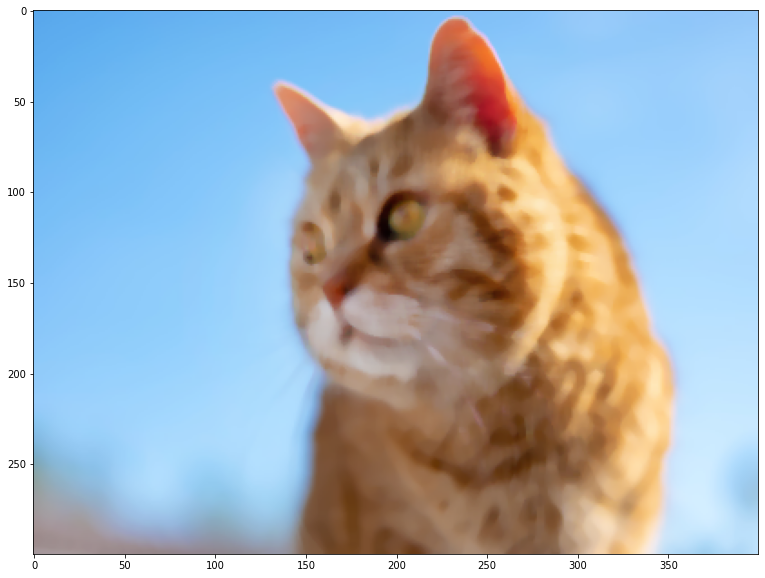

In [33]:
transform = A.Compose(
    [
    A.MedianBlur (blur_limit=7, always_apply=False, p=0.5)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

#### ToGray(),MultiplicativeNoise()
- "augmentation 기법들을 한 번에 조합하여 사용할 수는 없을까?" 라는 생각이 듭니다.
- 아래 코드 처럼 여러 가지의 augmentation 기법을 순차적으로 적용할 수 있습니다.

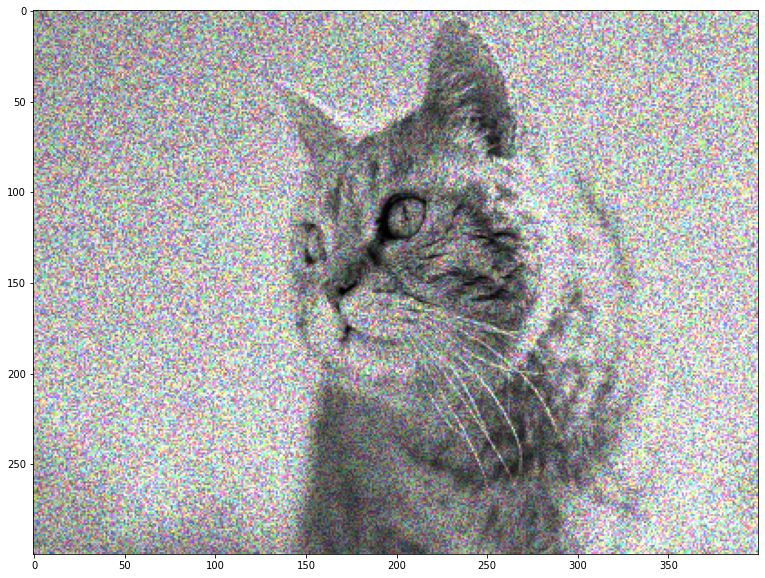

In [34]:
transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

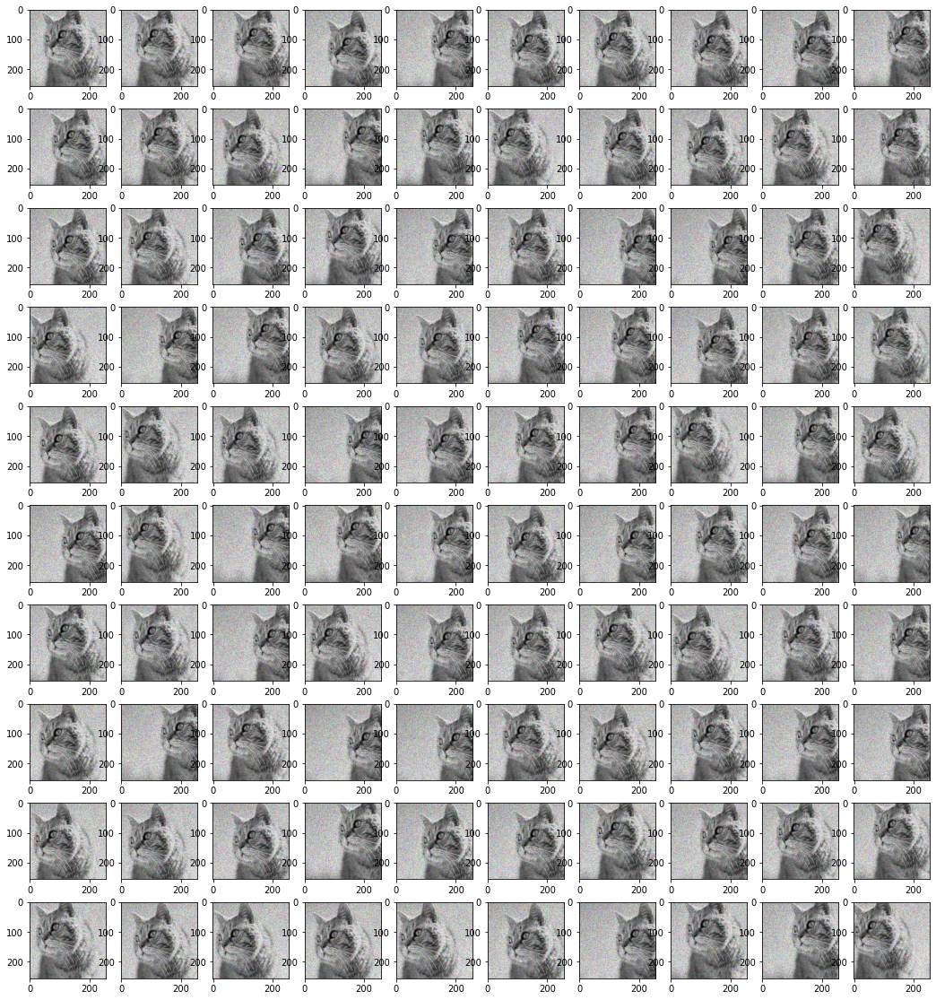

In [36]:
def transform_data(img_arr):
    transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], 
                          elementwise=True, per_channel=True, p=1),
     A.RandomCrop(width=256, height=256)
    ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)

---